In [1]:
import torch
import matplotlib.pyplot as plt
from networks import *
import os
from glob import glob
import re
import pandas as pd

In [16]:
record_list = []

regexp = re.compile(r"resnet_noise_std-\[(?P<std>-?[1-9]*[0-9]+(\.[0-9]*)?)\]_noise_mean-\[(?P<mean>-?[1-9]*[0-9]+(\.[0-9]*)?)\]_l2-0.0005_dropout-0.3_lr-0.01_epochs-200_lrdecayepoch-60_metric1.pkl")
for checkpoint_path in glob("checkpoint/cifar10/gaussian/*metric1.pkl"):
    checkpoint_name = os.path.basename(checkpoint_path)
    match = regexp.match(checkpoint_name)
    if match is None:
        print(checkpoint_name)
    else:
        training_std, training_mean = match.group("std"), match.group("mean")
    net = ResNet(18, 10, use_dropout=True, dropout_rate=0.3, in_channel=3)
    checkpoint = torch.load(checkpoint_path)
    try:
        net.load_state_dict(checkpoint['state_dict'])
    except:
        print(checkpoint_name + "FAILED")
        continue
    for name, param in net.named_parameters():
        save_dir = os.path.join("histogram", name)
        if os.path.exists(save_dir) is False:
            os.makedirs()
        param = param.view(-1).detach().numpy()
        weight_range = np.ptp(param)
        weight_mean = np.mean(param)
        record_list.append({
            "name": name,
            "training_std": training_std,
            "training_mean": training_mean,
            "weight_mean": weight_mean,
            "weight_range": weight_range
        })
        # fig, ax = plt.subplots()
        # ax.hist(param, bins=50)
        # ax.text(0.15, 0.9,
        #         "mean = {:.3f}\nrange = {:.3f}\nratio = {:.3f}".format(weight_range, weight_mean, weight_range/weight_mean), 
        #         horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
        # # plt.savefig(os.path.join(save_dir, f"std-{training_std}_mean-{training_mean}.png"))
        # print(name)
        # plt.show()
        # plt.close()
    # break

[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
resnet_noise_std-[0.05]_noise_mean-[0.02]_l2-0.0005_dropout-0.3_lr-0.01_epochs-200_lrdecayepoch-60_metric1.pklFAILED
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 11181642
[ResNet-18] Num parameters: 1118

In [20]:
df = pd.DataFrame(record_list)
df["training_std"] = df["training_std"].astype(float)
df["training_mean"] = df["training_mean"].astype(float)

In [2]:
df = pd.read_csv("weight_dist_table.csv")

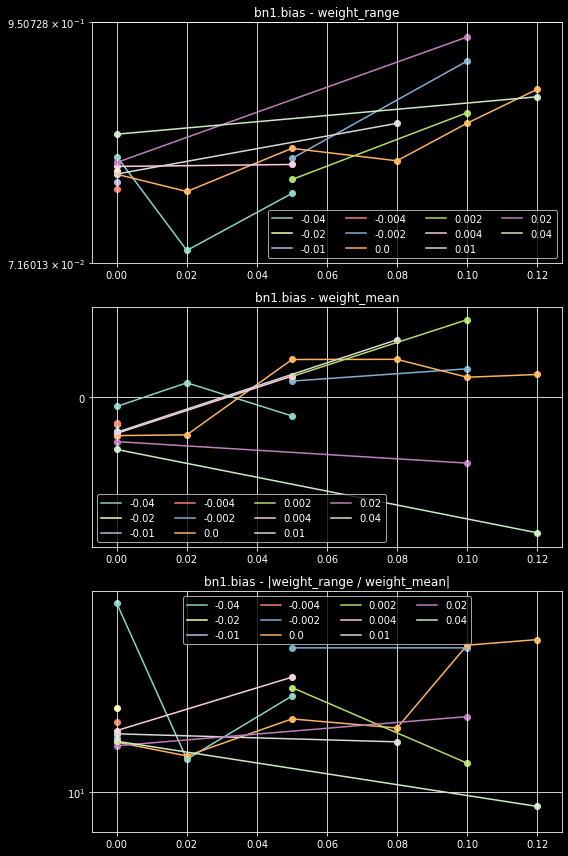

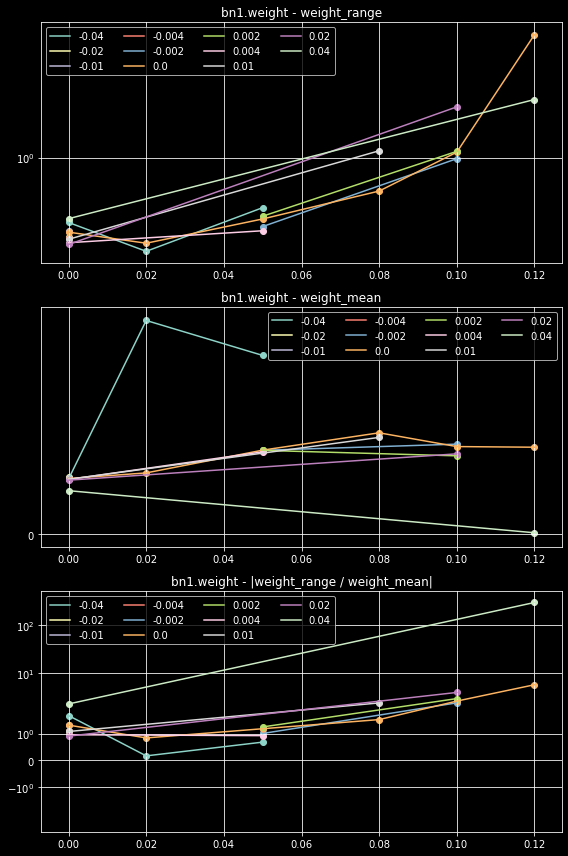

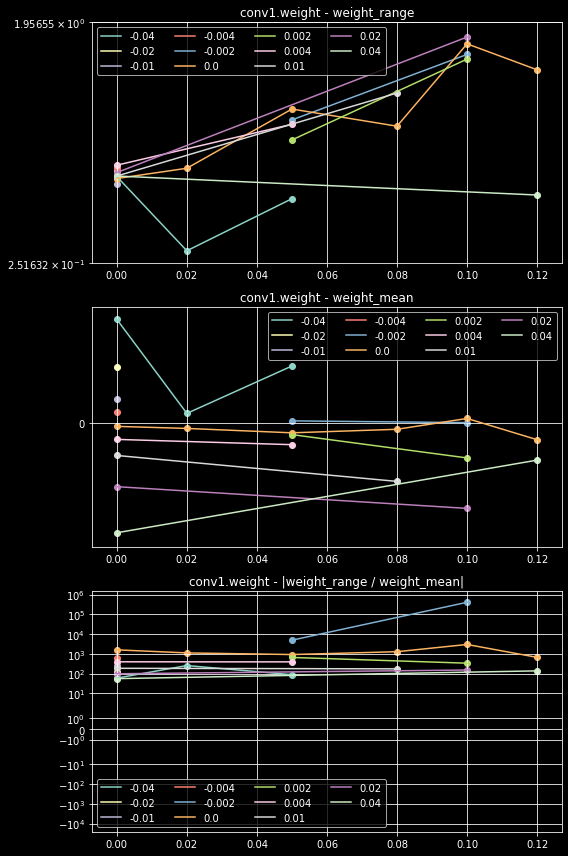

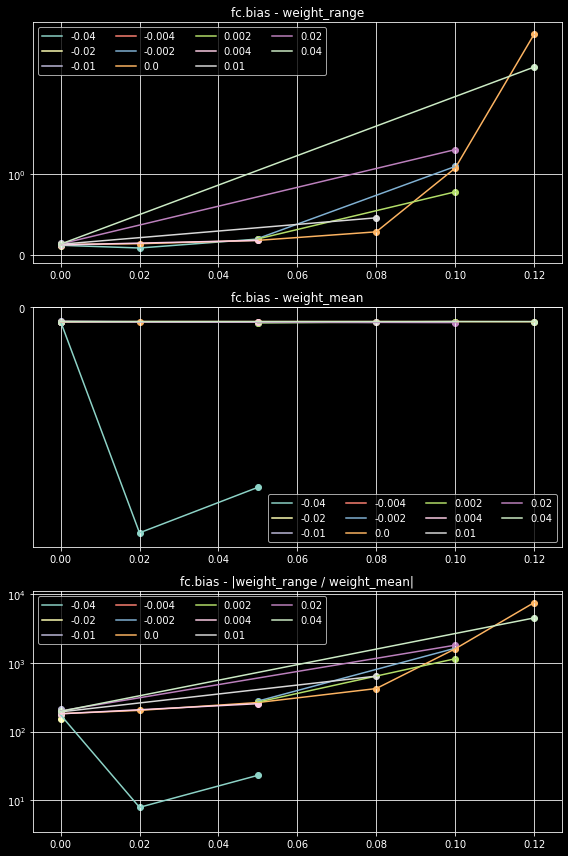

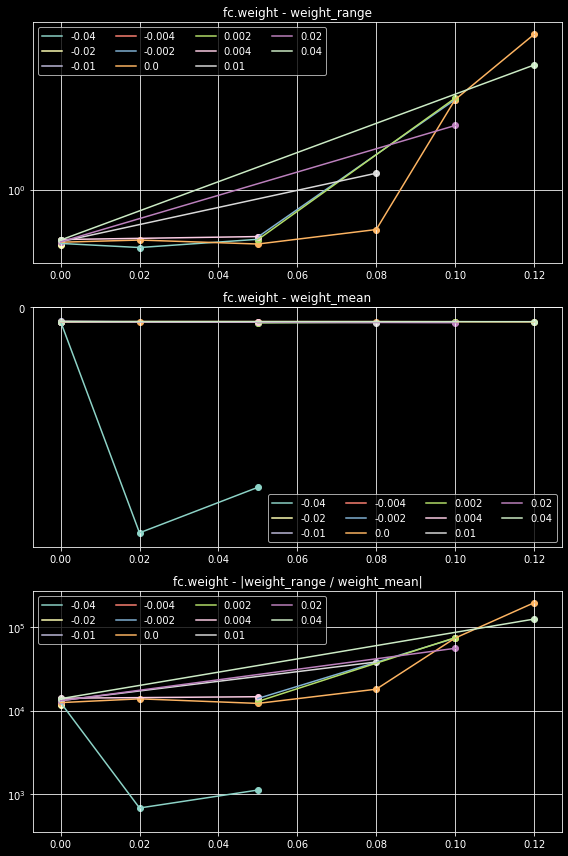

...

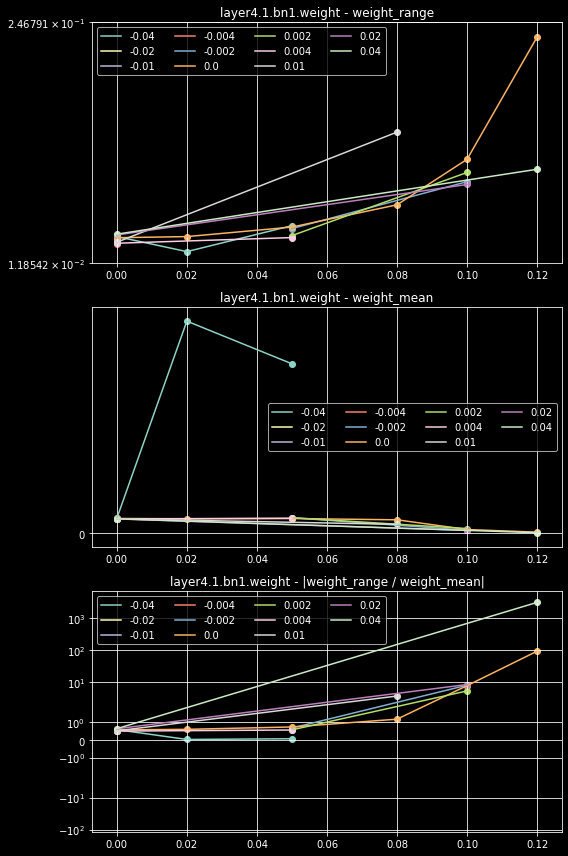

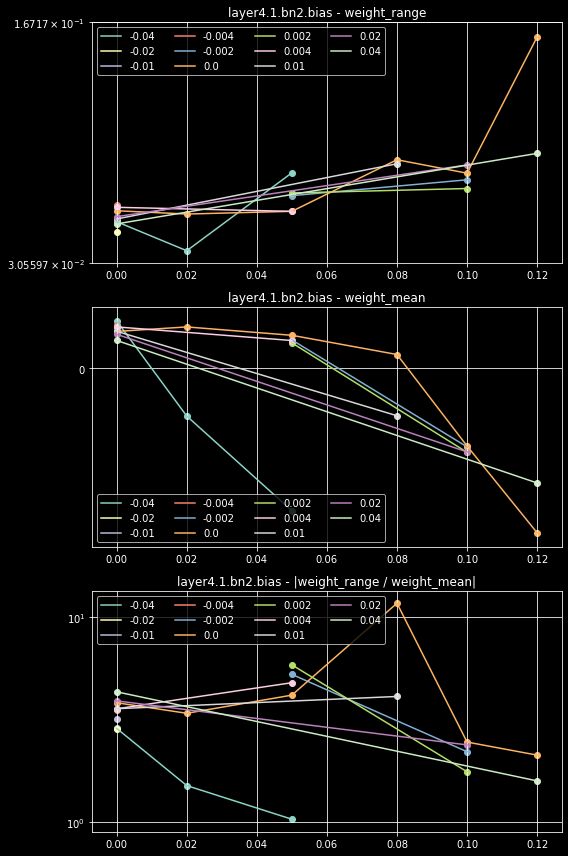

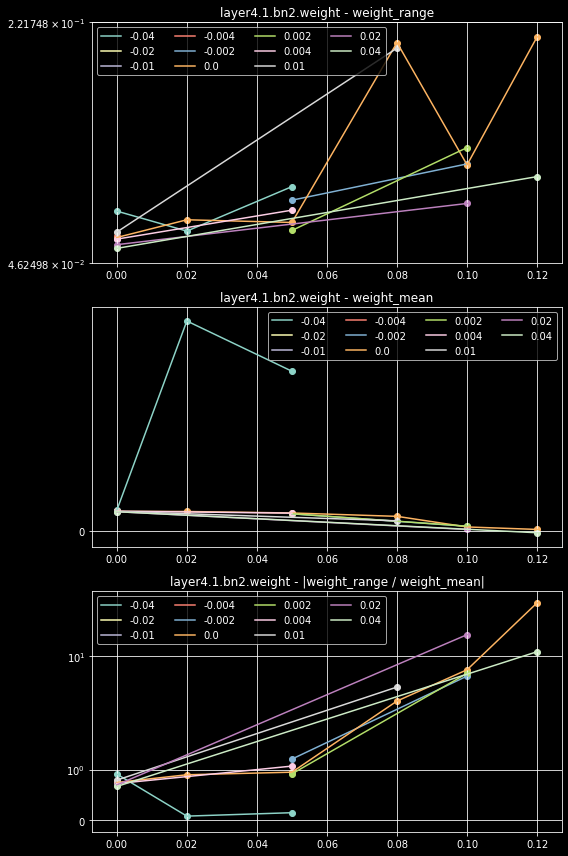

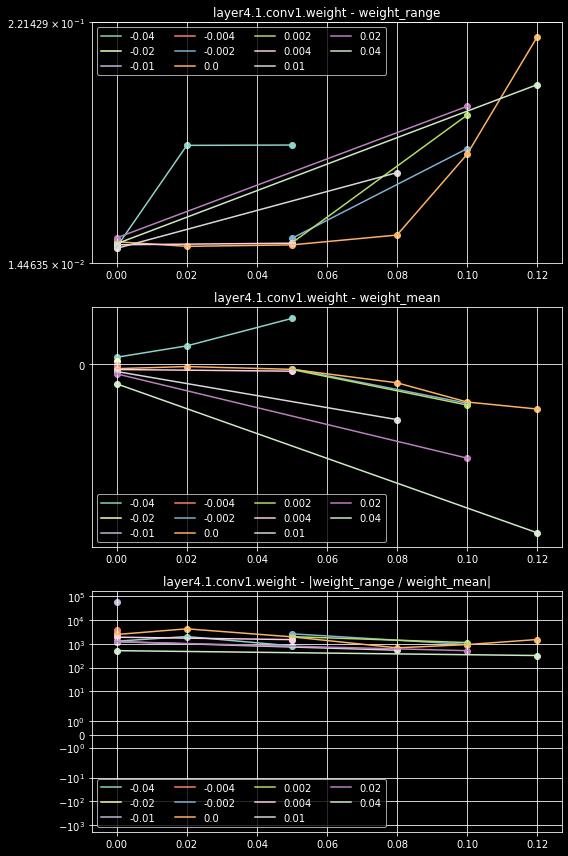

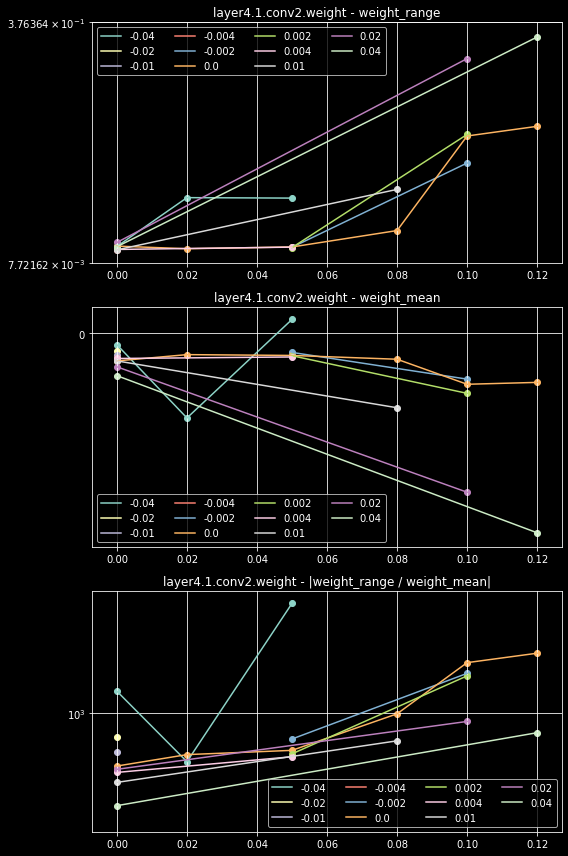

In [8]:
plt.style.use("dark_background")
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.Set3.colors)
for name, df_ in df[df["training_std"] < 0.15].groupby(["name"]):
    fig, axs = plt.subplots(nrows=3, figsize=(8,12))
    for training_mean, df__ in df_.groupby(["training_mean"]):
        df__ = df__.sort_values("training_std")
        axs[0].plot(df__["training_std"], df__["weight_range"], label=f"{training_mean}")
        axs[1].plot(df__["training_std"], df__["weight_mean"], label=f"{training_mean}")
        axs[2].plot(df__["training_std"], np.abs(df__["weight_range"] / df__["weight_mean"]), label=f"{training_mean}")
        axs[0].scatter(df__["training_std"], df__["weight_range"])
        axs[1].scatter(df__["training_std"], df__["weight_mean"])
        axs[2].scatter(df__["training_std"], np.abs(df__["weight_range"] / df__["weight_mean"]))
    axs[0].set_title(f"{name} - weight_range")
    axs[1].set_title(f"{name} - weight_mean")
    axs[2].set_title(f"{name} - |weight_range / weight_mean|")
    axs[0].set_yscale("symlog")
    axs[1].set_yscale("symlog")
    axs[2].set_yscale("symlog")
    axs[0].legend(ncol=4)
    axs[1].legend(ncol=4)
    axs[2].legend(ncol=4)
    axs[0].grid()
    axs[1].grid()
    axs[2].grid()
    plt.tight_layout()
    plt.show()
    plt.close()
    # break